In [1]:
import sys
import os
sys.path.insert(0,'../classes')
sys.path.insert(0,'../analysis')
import anl

sys.path.insert(0,'/home/zz737/projects/fiar/cog_model/fourinarow/Analysis notebooks/new')
hqfd = '/home/zz737/projects/fiar/cog_model/fourinarow/Analysis notebooks/new/Heuristic quality'
sys.path.insert(0,hqfd)
from fourinarowfunctions import *
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import logging
import numpy as np

import coloredlogs

from arena import Arena
from coach import Coach
from beck.beck_game import BeckGame as Game
from beck.beck_nnet import NNetWrapper as nn
from beck.beck_players import HumanBeckPlayer
from mcts import MCTS
from utils import *
log = logging.getLogger(__name__)

from keras import backend as K

import tournament
# participant_iters = tournament.participant_iters

participants_dir = '/scratch/zz737/fiar/tournaments/tournament_4' # dir for trained networks
results_dir = '/scratch/zz737/fiar/tournaments/results/tournament_4'
moves_dir = '/scratch/zz737/fiar/tournaments/tournament_4/moves/raw/'
splits_dir = '/scratch/zz737/fiar/tournaments/tournament_4/moves/splits/'

import load
import plot_fun
from importlib import reload
reload(load)

{'mcts100_cpuct1': [1, 2, 3, 4, 6, 7, 9, 11, 12, 16, 18, 21, 25, 28, 29, 30, 37, 38, 39, 45, 47], 'mcts100_cpuct2': [1, 2, 3, 4, 6, 8, 12, 14, 15, 16, 21, 22, 24, 26, 27, 30, 32, 35, 39], 'mcts100_cpuct3': [1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 16, 17, 18, 20, 21, 25, 26, 28, 32, 34, 35, 36], 'mcts25_cpuct1': [1, 2, 3, 4, 9, 11, 13, 14, 16, 19, 22, 25, 28, 29, 31, 37, 39, 45, 59, 61], 'mcts50_cpuct1': [1, 2, 3, 4, 5, 6, 7, 9, 10, 13, 17, 18, 20, 21, 23, 25, 28, 29, 31, 37, 39, 41, 44, 45, 47, 48, 53], 'mcts80_cpuct1': [1, 2, 3, 4, 5, 7, 8, 9, 10, 13, 16, 19, 20, 21, 23, 24, 28, 34, 35, 36, 40], 'mcts80_cpuct2': [1, 2, 5, 6, 8, 10, 12, 13, 15, 17, 18, 19, 22, 25, 28, 30, 31, 34, 37, 38, 39, 40, 43, 45, 46, 51], 'mcts80_cpuct3': [1, 2, 5, 6, 7, 9, 12, 13, 14, 19, 21, 22, 23, 24, 26, 27, 28, 35, 36, 42, 43, 47, 49, 50, 51, 53, 54, 55, 56, 57]}
189 participant iterations!


<module 'load' from '../analysis/load.py'>

In [2]:
import value_analysis as va
import pandas as pd
import create_database as cd

In [3]:
opt_boards, opt_values=va.load_opt_value_test_boards()

In [78]:
npieces_list = (opt_boards!=0).sum(axis=(1,2))
mask = (npieces_list > 5) & (npieces_list < 25)

In [81]:
len(np.nonzero(mask)[0]) * 22

71478

In [4]:
import pandas as pd
import create_database as cd

all_players = pd.read_pickle(cd.DATABASE_LOC)

In [5]:
all_players = pd.read_pickle(cd.DATABASE_LOC)
mask = all_players['value_func_type'] == 'nn'
mask &= all_players['tree_type'] == 'mcts'
mask &= all_players['n_mcts'] == 100
mask &= all_players['cpuct'] == 2
mask &= all_players['tournament'] == 6
participants = all_players.loc[mask]
mask = ['id-0' in pid for pid in participants.id]
participants = participants.iloc[mask]

In [10]:
len(participants)

22

In [48]:
mask = all_players['value_func_type'] == 'nn'
mask &= all_players['tree_type'] == 'mcts'
mask &= all_players['n_mcts'] == 100
mask &= all_players['cpuct'] == 2
mask &= all_players['tournament'] == 1
all_players.loc[mask]

,tree_type,value_func_type,other_type,n_mcts,cpuct,value_func_iter,mcts_iter,n_bfts,pruning_thresh,center,2_con,2_uncon,3,4,oppo_scale,id,tournament,mcts_location,value_func_location,better_than_last
151,mcts,nn,NaN,100,2,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;1,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
152,mcts,nn,NaN,100,2,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;2,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
153,mcts,nn,NaN,100,2,3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;3,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
154,mcts,nn,NaN,100,2,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;4,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
155,mcts,nn,NaN,100,2,6,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;6,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
156,mcts,nn,NaN,100,2,8,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;8,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
157,mcts,nn,NaN,100,2,12,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;12,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
158,mcts,nn,NaN,100,2,14,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;14,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
159,mcts,nn,NaN,100,2,15,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;15,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
160,mcts,nn,NaN,100,2,16,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct2;16,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True


In [5]:
one_info = all_players.loc[all_players['id']=='tournament_6;mcts100;cpuct2;id-0;51'].iloc[0]

In [6]:
import tournament_new as tn
game = Game(4,9,4)
ai,val_func,tree = tn.get_player(game, one_info)

In [7]:
import compute_depth_parallel as cdp
pvcorr_res=cdp.read_depth_entropy_result(to_read='pvcorr')

In [17]:
import compute_depth_parallel as cdp
reload(cdp)
depth_res=cdp.read_depth_entropy_result(to_read='depth')

27 participants


In [9]:
entropy_res=cdp.read_depth_entropy_result(to_read='entropy')

In [10]:
Ns_weighted_ent_res = cdp.read_depth_entropy_result(to_read='NsWeightedMeanEntropy')

In [11]:
depth_res_unstacked_depth = depth_res.groupby(['bp','wp','iter']).median().unstack(level=-1)['depth']

entropy_res_unstacked_depth = entropy_res.groupby(['bp','wp','iter']).median().unstack(level=-1)['entropy']



In [24]:
import copy
res_df = []
all_res = [depth_res, entropy_res, Ns_weighted_ent_res, pvcorr_res]
res_df = all_res[0]
for res in all_res[1:]:
    res_df = res_df.join(res.set_index(['bp','wp','iter','npieces','id']),on=['bp','wp','iter','npieces','id'],how='inner')
    
#     res_df.append(res.set_index(['bp','wp','iter','npieces','id']))
# res_df = pd.concat(res_df,axis=1,join='inner')
# res_df = res_df.reset_index()

In [6]:
import compute_depth_parallel as cdp
res_df_id2 = cdp.read_multi_result(to_read_l=['depth','entropy','NsWeightedMeanEntropy','pvcorr'])

27 participants


<AxesSubplot:xlabel='pvcorr', ylabel='entropy'>

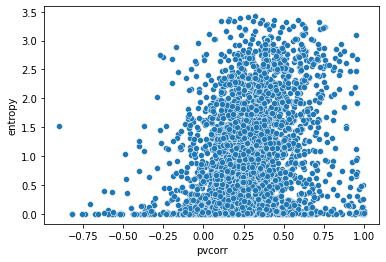

In [49]:
import seaborn as sns
sns.scatterplot(x='pvcorr',y='',data=res_df.loc[res_df['iter']==51])

<AxesSubplot:xlabel='entropy', ylabel='Ns_weighted_mean_entropy'>

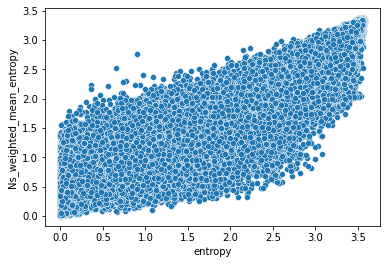

In [15]:
sns.scatterplot(x='entropy',y='Ns_weighted_mean_entropy',data=res_df)

<AxesSubplot:xlabel='entropy', ylabel='depth'>

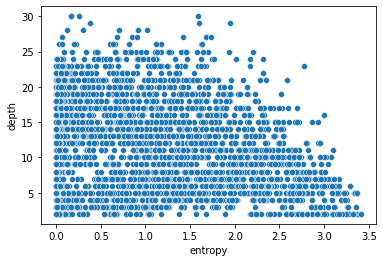

In [67]:
sns.scatterplot(x='entropy',y='depth',data=res_df_id2.loc[res_df_id2['iter']==50])

In [255]:
b = game.getInitBoard()
bp = depth_entropy_res.loc[18,'bp'].iloc[0]
wp = depth_entropy_res.loc[18,'wp'].iloc[0]
for piece,sign in zip([bp,wp],[1,-1]):
    inds=np.nonzero(np.flip(np.array(list(np.binary_repr(piece)),dtype=int)))[0]
    xs,ys = inds//game.n, inds%game.n
    b[xs,ys] = sign

In [256]:
tree.refresh()
tree.getActionProb(b)

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [198]:
print(ent_during_search.mean())
print(np.median(ent_during_search))
print(ent_during_search.std())

0.22982939859248397
0.031057164185974713
0.3268223793887048


In [194]:
print(ent_during_search.mean())
print(np.median(ent_during_search))
print(ent_during_search.std())

0.15366174527897325
0.007503420205047559
0.25230325793104424


In [260]:
importlib.reload(va)
va.get_Ns_weighted_mean_entropy_one_board_one_model(b,tree)

0.15700554227158747

In [257]:
eps=1e-9

ns_ps=pd.concat([pd.Series(tree.Ns),pd.Series(tree.Ps)],keys=['Ns','Ps'],axis=1)

ns_ps['entropy']=va.entropy(np.stack(ns_ps['Ps'].values,axis=0)+eps)

(ns_ps['Ns'] * ns_ps['entropy']).sum()/ns_ps['Ns'].sum()

0.15700621028926096

In [268]:
!python ../classes/compute_depth_parallel.py 1 NsWeightedMeanEntropy

['1', 'NsWeightedMeanEntropy']
2021-12-22 15:13:44.139583: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64:/.singularity.d/libs
2021-12-22 15:13:44.139611: E tensorflow/stream_executor/cuda/cuda_driver.cc:313] failed call to cuInit: UNKNOWN ERROR (303)
get depth sample board: 100%|███████████████████| 3/3 [00:00<00:00, 8671.89it/s]


In [126]:
tree.refresh()

In [127]:
tree.getActionProb(b)

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [155]:
depth_entropy_res.loc[(depth_entropy_res['entropy'] < 0.1)&(depth_entropy_res['depth'] > 1)]

,depth,depth_ratio,npieces,bp,wp,iter,id,entropy
8,12,0.600000,16,12067852,9131268113,51,tournament_6;mcts100;cpuct2;id-0;51,0.035700
18,18,1.000000,18,6194991184,2293260324,51,tournament_6;mcts100;cpuct2;id-0;51,0.018557
19,10,0.526316,17,10510892,13425974290,51,tournament_6;mcts100;cpuct2;id-0;51,0.028402
20,5,0.227273,14,12905922568,3231719520,51,tournament_6;mcts100;cpuct2;id-0;51,0.080232
24,12,0.705882,19,2422232070,40266377632,51,tournament_6;mcts100;cpuct2;id-0;51,0.027356
...,...,...,...,...,...,...,...,...
3147,3,0.200000,21,12898078769,1361111116,25,tournament_6;mcts100;cpuct2;id-0;25,0.058196
3159,6,0.200000,6,12587008,5370806272,25,tournament_6;mcts100;cpuct2;id-0;25,0.090945
3175,15,0.833333,18,10747927560,5389722130,25,tournament_6;mcts100;cpuct2;id-0;25,0.003565
3193,3,0.214286,22,2729191492,1548780074,25,tournament_6;mcts100;cpuct2;id-0;25,0.014078


<AxesSubplot:xlabel='iter', ylabel='bp-wp'>

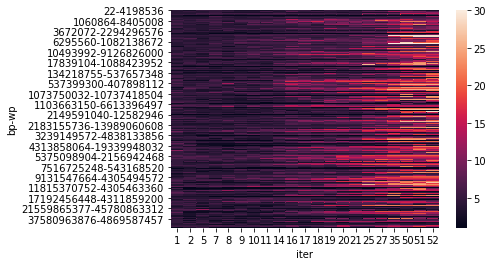

In [69]:
sns.heatmap(depth_res_unstacked_depth)

In [ ]:
depth_res['id']

In [16]:
np.isnan(depth_res['iter'].iloc[0])

True

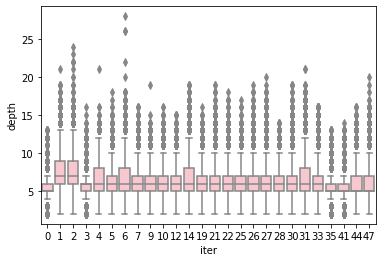

In [18]:
fig=sns.boxplot(x='iter',y='depth',data=depth_res,color='pink').figure




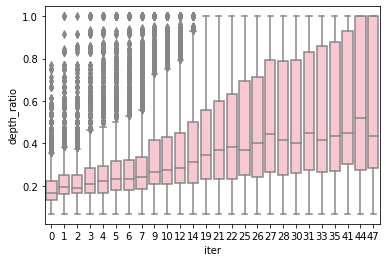

In [11]:
fig=sns.boxplot(x='iter',y='depth_ratio',data=res_df_id2,color='pink').figure



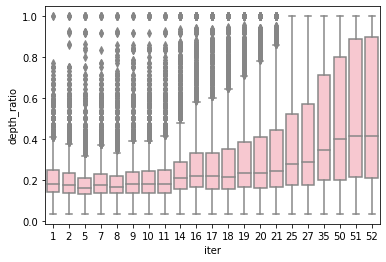

In [54]:
fig=sns.boxplot(x='iter',y='depth_ratio',data=depth_res,color='pink').figure


In [34]:
res['pieces'].iloc[0].dtype

dtype((numpy.record, [('bp', '<i8'), ('wp', '<i8')]))

<AxesSubplot:xlabel='iter', ylabel='pvcorr'>

/ext3/miniconda3/envs/fourinarow/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


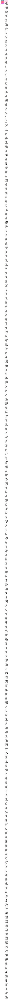

In [44]:
import seaborn as sns
sns.lineplot(data=res,x='iter',y='pvcorr',hue='pieces')

In [43]:
res['pieces'] = 'b'+res['bp'].astype(str) + 'w'+res['wp'].astype(str)

In [110]:
import seaborn as sns

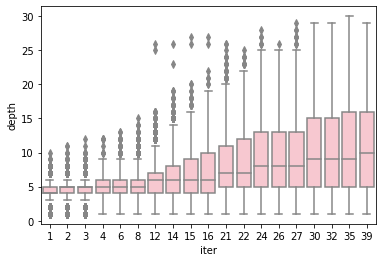

In [139]:
fig=sns.boxplot(x='iter',y='depth',data=depth_df_all,color='pink').figure


In [140]:
fig.savefig('tournament1_mcts100_cpuct2_depth.jpg')

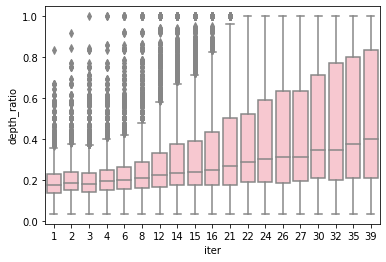

In [142]:
fig=sns.boxplot(x='iter',y='depth_ratio',data=depth_df_all,color='pink').figure

In [143]:
fig.savefig('tournament1_mcts100_cpuct2_depth_ratio.jpg')

In [154]:
importlib.reload(va)

<module 'value_analysis' from '../analysis/value_analysis.py'>

In [155]:
opt_boards, opt_values=va.load_opt_value_test_boards()
DEPTH_RES_DIR = '/scratch/zz737/fiar/depth/tournament_1_mcts100_cpuct2'
participants = pd.read_pickle(os.path.join(DEPTH_RES_DIR,'participants.pkl'))
game = Game(4,9,4)
ai,val_func,tree = tn.get_player(game,participants.iloc[0])

va.get_entropy_one_model_all_boards(opt_boards[:10],val_func)

,entropy,npieces
0,3.492419,6
1,3.493801,7
2,3.473331,8
3,3.462026,9


In [156]:
!python ../classes/compute_depth_parallel.py 0 entropy

['0', 'entropy']
2021-11-21 16:34:55.607573: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64:/.singularity.d/libs
2021-11-21 16:34:55.607603: E tensorflow/stream_executor/cuda/cuda_driver.cc:313] failed call to cuInit: UNKNOWN ERROR (303)


In [5]:
import compute_depth_parallel as cdp
entropy_df_al = cdp.read_depth_entropy_result(to_read='entropy')

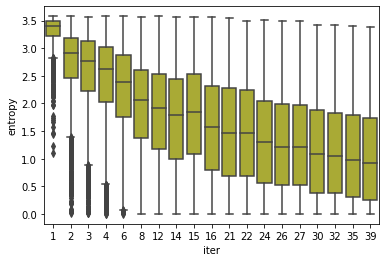

In [22]:
import seaborn as sns
fig=sns.boxplot(x='iter',y='entropy',data=entropy_df_al,color='C8').figure
# fig.savefig('tournament_1_mcts100_cpuct2_entropy.jpg')

In [20]:
entropy_median_grouped = entropy_df_al.groupby(['npieces','iter'])['entropy'].median()
entropy_median_grouped = entropy_median_grouped.unstack()

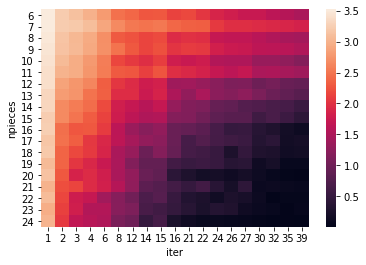

In [23]:
fig=sns.heatmap(data=entropy_median_grouped).figure
fig.savefig('tournament_1_mcts100_cpuct2_entropy_heat.jpg')

In [12]:
reload(cdp)

27 participants


<module 'compute_depth_parallel' from '../classes/compute_depth_parallel.py'>

In [18]:
import tournament_new as tn
game = Game(4,9,4)
_,_,tree=tn.get_player(game,cdp.participants.iloc[0])

In [19]:
tree.getActionProb(game.getInitBoard())

[0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

In [25]:
game.str_rep_to_array(list(tree.Es.keys())[0])

array([[0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [39]:
columns = pd.MultiIndex.from_product([all_players['id'],['row_win','col_win','draw']])
rows = all_players['id']
results_df = pd.DataFrame(0,index=rows, columns=columns)

In [37]:
results_df.loc[:,:]=0

In [43]:
results_df.loc['tournament_1;mcts25;cpuct1;1',('tournament_1;mcts25;cpuct1;1','row_win')] +=1

In [46]:
results_df.loc['tournament_1;mcts25;cpuct1;1','tournament_1;mcts25;cpuct1;1'].sum()

1

In [55]:
import repeated_tournament as rt
reload(rt)

<module 'repeated_tournament' from '../classes/repeated_tournament.py'>

In [56]:
test_res_df=rt.play_ai_round_parallel(0,rep=1)

[2021-12-24 10:51:11.041528] Starting round robin!
[2021-12-24 10:51:11.042598] Skipping tournament_1;mcts25;cpuct1;1 v/s tournament_1;mcts25;cpuct1;1...
[2021-12-24 10:51:11.043135] tournament_1;mcts25;cpuct1;1 v/s tournament_1;mcts25;cpuct1;11!
rep 0


Game beginning! tournament_1;mcts25;cpuct1;1 v/s tournament_1;mcts25;cpuct1;11...
res -1


In [58]:
test_res_df.loc[rt.participants_info.iloc[0].id,(rt.participants_info.iloc[1].id,'col_win')]+=1

In [61]:
test_res_df.loc[rt.participants_info.iloc[0].id,rt.participants_info.iloc[1].id]

row_win    0
col_win    2
draw       0
Name: tournament_1;mcts25;cpuct1;1, dtype: int64

In [59]:
test_res_df

id                                                 tournament_1;mcts25;cpuct1;1  \
                                                                        row_win   
id                                                                                
tournament_1;mcts25;cpuct1;1                                                  0   
tournament_1;mcts25;cpuct1;2                                                  0   
tournament_1;mcts25;cpuct1;3                                                  0   
tournament_1;mcts25;cpuct1;4                                                  0   
tournament_1;mcts25;cpuct1;9                                                  0   
...                                                                         ...   
tournament_7;mcts100;cpuct2;id-0;33;bfts100;prune2                            0   
cog_id_1;tournament_7;mcts100;cpuct2;id-0;38                                  0   
tournament_7;mcts100;cpuct2;id-0;38;bfts100;prune2                            0   
cog_id_1;tournament_7;mcts100;cpuct2;id-0;52                                  0   
tournament_7;mcts100;cpuct2;id-0;52;bfts100;prune2                            0   

id                                                               \
                                                   col_win draw   
id                                                                
tournament_1;mcts25;cpuct1;1                             0    0   
tournament_1;mcts25;cpuct1;2                             0    0   
tournament_1;mcts25;cpuct1;3                             0    0   
tournament_1;mcts25;cpuct1;4                             0    0   
tournament_1;mcts25;cpuct1;9                             0    0   
...                                                    ...  ...   
tournament_7;mcts100;cpuct2;id-0;33;bfts100;prune2       0    0   
cog_id_1;tournament_7;mcts100;cpuct2;id-0;38             0    0   
tournament_7;mcts100;cpuct2;id-0;38;bfts100;prune2       0    0   
cog_id_1;tournament_7;mcts100;cpuct2;id-0;52             0    0   
tournament_7;mcts100;cpuct2;id-0;52;bfts100;prune2       0    0   

id                                                 tournament_1;mcts25;cpuct1;2  \
                                                                        row_win   
id                                                                                
tournament_1;mcts25;cpuct1;1                                                  0   
tournament_1;mcts25;cpuct1;2                                                  0   
tournament_1;mcts25;cpuct1;3                                                  0   
tournament_1;mcts25;cpuct1;4                                                  0   
tournament_1;mcts25;cpuct1;9                                                  0   
...                                                                         ...   
tournament_7;mcts100;cpuct2;id-0;33;bfts100;prune2                            0   
cog_id_1;tournament_7;mcts100;cpuct2;id-0;38                                  0   
tournament_7;mcts100;cpuct2;id-0;38;bfts100;prune2                            0   
cog_id_1;tournament_7;mcts100;cpuct2;id-0;52                                  0   
tournament_7;mcts100;cpuct2;id-0;52;bfts100;prune2                            0   

id                                                               \
                                                   col_win draw   
id                                                                
tournament_1;mcts25;cpuct1;1                             0    0   
tournament_1;mcts25;cpuct1;2                             0    0   
tournament_1;mcts25;cpuct1;3                             0    0   
tournament_1;mcts25;cpuct1;4                             0    0   
tournament_1;mcts25;cpuct1;9                             0    0   
...                                                    ...  ...   
tournament_7;mcts100;cpuct2;id-0;33;bfts100;prune2       0    0   
cog_id_1;tournament_7;mcts100;cpuct2;id-0;38             0    0  

In [76]:
mask = all_players.tournament >=5 
mask |= all_players.tournament.isna()
mask |=(all_players.tournament==1)
participants_info = all_players.loc[mask]

In [77]:
len(participants_info)

701

In [75]:
participants_info

,tree_type,value_func_type,other_type,n_mcts,cpuct,value_func_iter,mcts_iter,n_bfts,pruning_thresh,center,2_con,2_uncon,3,4,oppo_scale,id,tournament,mcts_location,value_func_location,better_than_last
129,mcts,nn,NaN,100,1,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct1;1,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
130,mcts,nn,NaN,100,1,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct1;2,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
131,mcts,nn,NaN,100,1,3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct1;3,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
132,mcts,nn,NaN,100,1,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct1;4,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
133,mcts,nn,NaN,100,1,6,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tournament_1;mcts100;cpuct1;6,1,/scratch/zz737/fiar/tournaments/tournament_1/c...,/scratch/zz737/fiar/tournaments/tournament_1/c...,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1480,bfts,nn,NaN,NaN,NaN,33,NaN,100,2,NaN,NaN,NaN,NaN,NaN,NaN,tournament_7;mcts100;cpuct2;id-0;33;bfts100;pr...,7,NaN,/scratch/zz737/fiar/tournaments/tournament_7/c...,True
1481,mcts,cog,NaN,100,2,NaN,38,NaN,NaN,0.01,0.2,0.05,2,100,0.1,cog_id_1;tournament_7;mcts100;cpuct2;id-0;38,7,/scratch/zz737/fiar/tournaments/tournament_7/c...,NaN,True
1482,bfts,nn,NaN,NaN,NaN,38,NaN,100,2,NaN,NaN,NaN,NaN,NaN,NaN,tournament_7;mcts100;cpuct2;id-0;38;bfts100;pr...,7,NaN,/scratch/zz737/fiar/tournaments/tournament_7/c...,True
1483,mcts,cog,NaN,100,2,NaN,52,NaN,NaN,0.01,0.2,0.05,2,100,0.1,cog_id_1;tournament_7;mcts100;cpuct2;id-0;52,7,/scratch/zz737/fiar/tournaments/tournament_7/c...,NaN,True


In [67]:
all_players.loc[all_players.tournament.isna()]

,tree_type,value_func_type,other_type,n_mcts,cpuct,value_func_iter,mcts_iter,n_bfts,pruning_thresh,center,2_con,2_uncon,3,4,oppo_scale,id,tournament,mcts_location,value_func_location,better_than_last
964,bfts,cog,NaN,NaN,NaN,NaN,NaN,100,2,0.01,0.2,0.05,2,100,0.1,;bfts100;prune2;cog_id_1,NaN,NaN,NaN,NaN
965,bfts,cog,NaN,NaN,NaN,NaN,NaN,100,1,0.01,0.2,0.05,2,100,0.1,;bfts100;prune1;cog_id_1,NaN,NaN,NaN,NaN
